In [1]:
import os
import numpy as np
from plantcv import plantcv as pcv

In [2]:
import matplotlib
matplotlib.rcParams['image.interpolation'] = "nearest"
matplotlib.rcParams['figure.figsize'] = [4.4, 2.8]

In [3]:
pcv.params.debug = "plot"
pcv.params.dpi = 300

In [4]:
# Store data filename Tray 1
scandirtray_1 = "/external/sentinel_share/users/grace/LemnaTec/vnir/2022-09-02/2022-09-02__11-06-24-228"
imgnametray_1 = "e0371521-fca9-4b74-973a-3d8163536025_data"
filepathtray_1 = os.path.join(scandirtray_1, imgnametray_1)

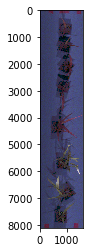

In [5]:
# Read in the hyperspectral data
psent_tray_1 = pcv.readimage(filename=filepathtray_1, mode="envi")

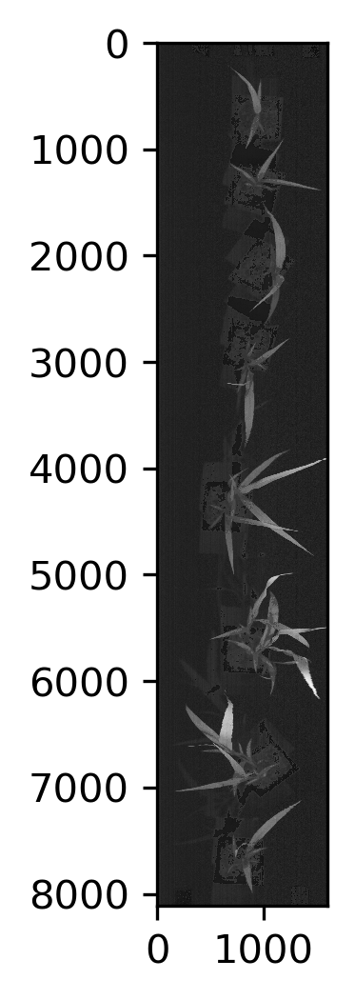

In [7]:
# Soil Adjusted Vegetation Index [Huete et al. (1988)]
savitray_1 = pcv.spectral_index.savi(hsi=psent_tray_1, distance = 5)

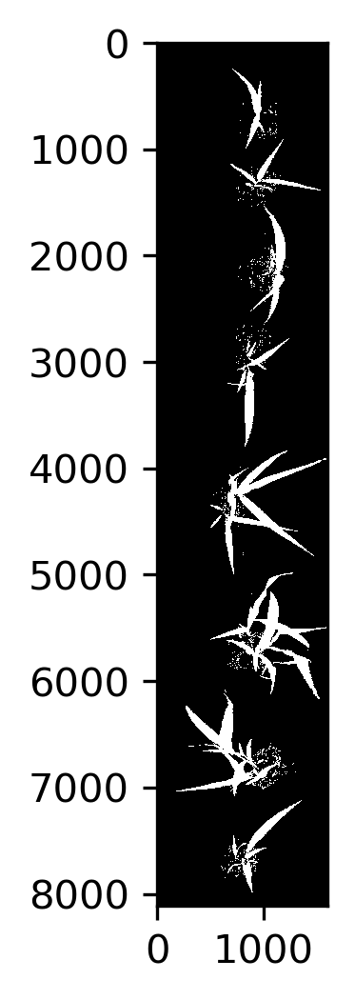

In [15]:
savitray_1_thresh = pcv.threshold.binary(gray_img=savitray_1.array_data, threshold=0.12, max_value=255)

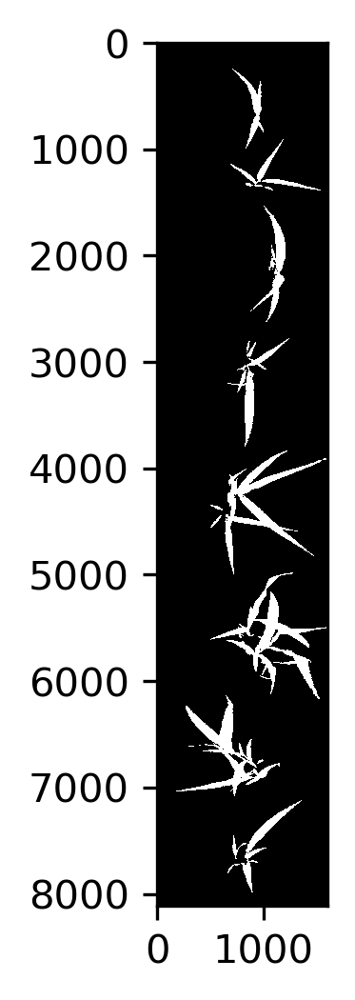

In [16]:
fill_savitray_1_thresh = pcv.fill(savitray_1_thresh, 1000)

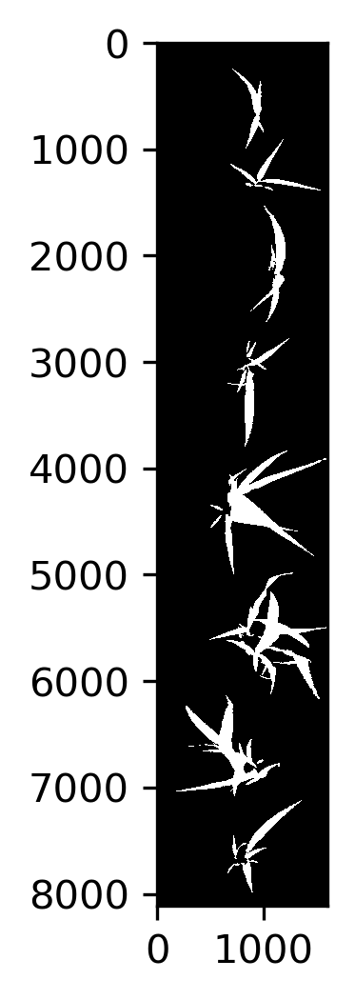

In [17]:
fill_imagetray_1 = pcv.fill_holes(fill_savitray_1_thresh)

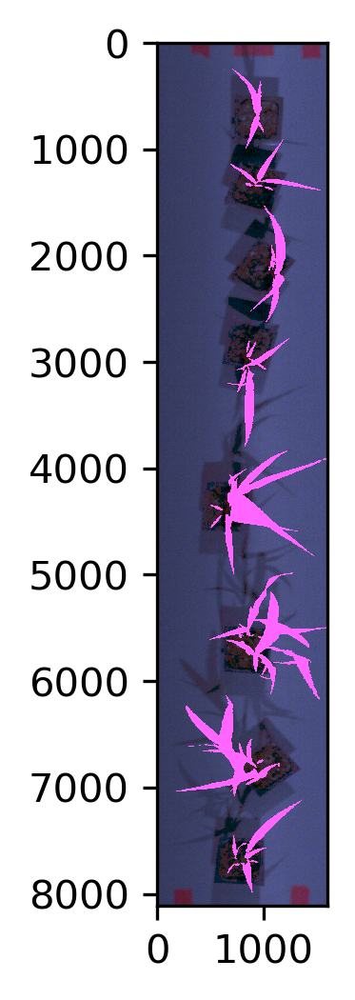

In [18]:
id_objects, obj_hierarchy = pcv.find_objects(psent_tray_1.pseudo_rgb, fill_imagetray_1)

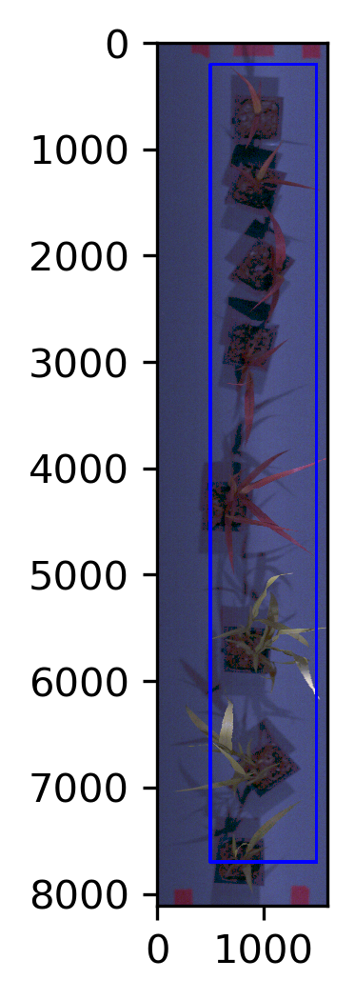

In [19]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi1, roi_hierarchy1= pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=500, y=200, h=7500, w=1000)

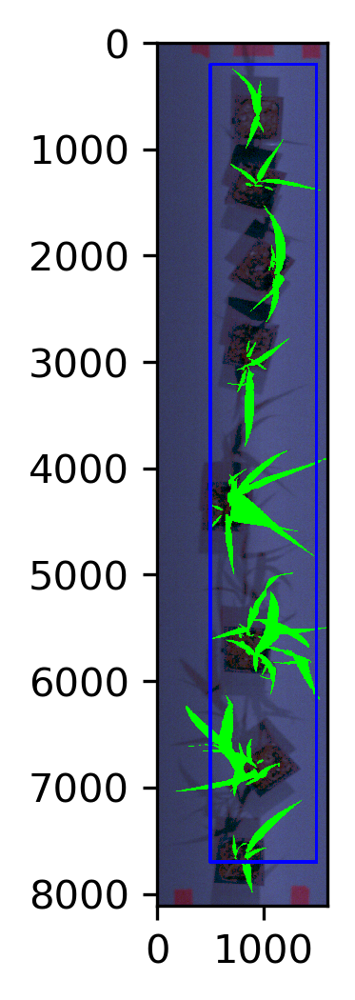

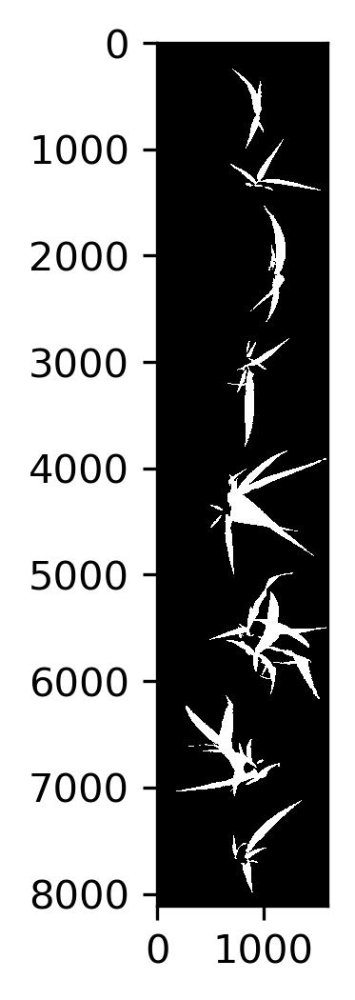

In [20]:
roi_objects1, hierarchy1, kept_mask1, obj_area1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb, roi_contour=roi1, 
                                                               roi_hierarchy=roi_hierarchy1, 
                                                               object_contour=id_objects, 
                                                               obj_hierarchy=obj_hierarchy,
                                                               roi_type='partial')

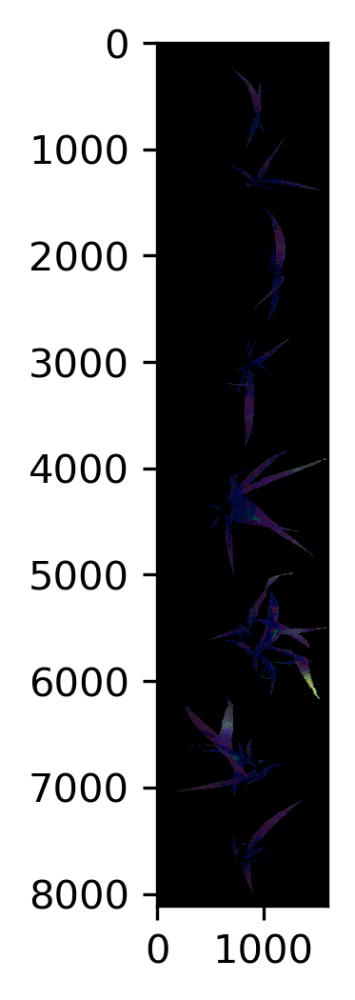

In [21]:
psent_tray_1.array_data = pcv.apply_mask(img=psent_tray_1.array_data, mask=kept_mask1, mask_color="black")

In [22]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_m3034_setaria_reflectance.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


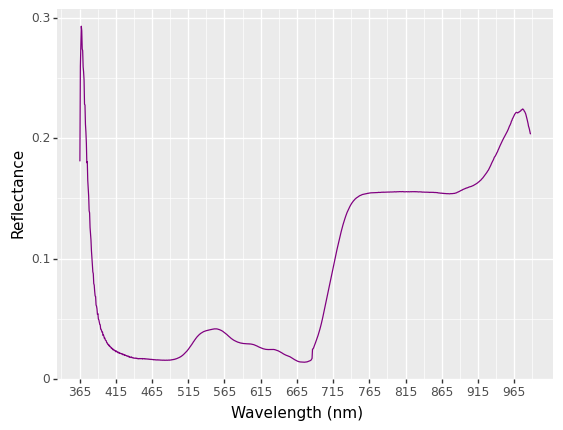

In [23]:
pcv.outputs.clear()
pcv.params.debug='plot'

psent_166_tray1 = pcv.hyperspectral.analyze_spectral(array=psent_tray_1, mask=kept_mask1, histplot=True)

/shares/mgehan_share/lacosta-gamboa/plantcv/plantcv/plantcv/spectral_index/spectral_index.py:154: RuntimeWarning: divide by zero encountered in true_divide
/shares/mgehan_share/lacosta-gamboa/plantcv/plantcv/plantcv/spectral_index/spectral_index.py:154: RuntimeWarning: invalid value encountered in subtract


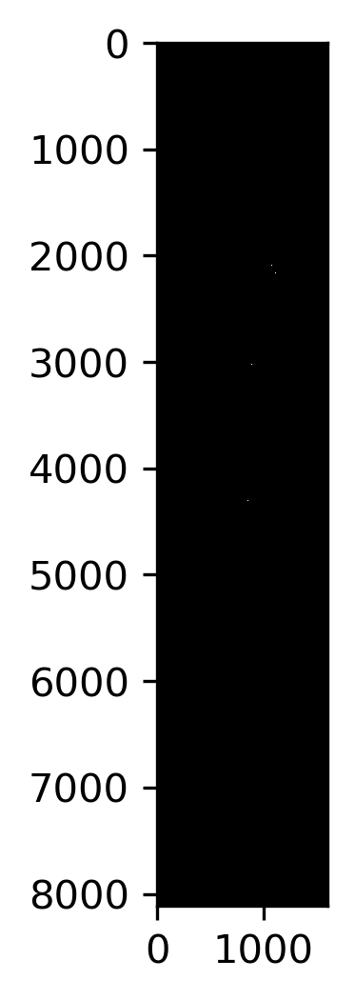

In [24]:
# ARI
ari_psent_tray_1 = pcv.spectral_index.ari(hsi=psent_tray_1, distance = 5)

In [25]:
ari_psent_tray_1_grayscale = ari_psent_tray_1.array_data

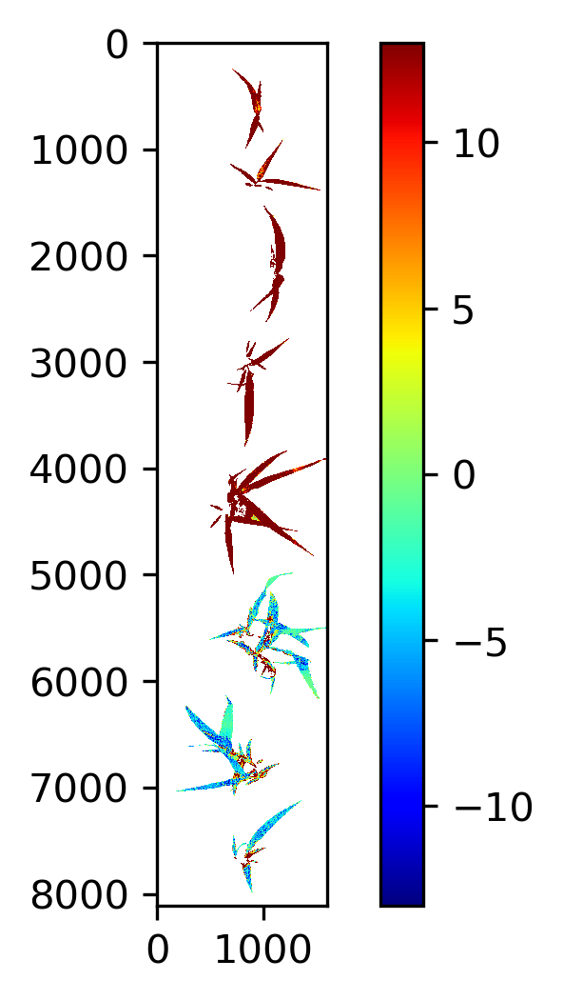

In [26]:
pseudo_ari_psent_tray_1 = pcv.visualize.pseudocolor(gray_img = ari_psent_tray_1_grayscale, mask=kept_mask1, cmap='jet', 
                                           min_value=-13, max_value=13)

In [27]:
pcv.print_image(pseudo_ari_psent_tray_1, "/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_me034_setaria_reflectance.svg")

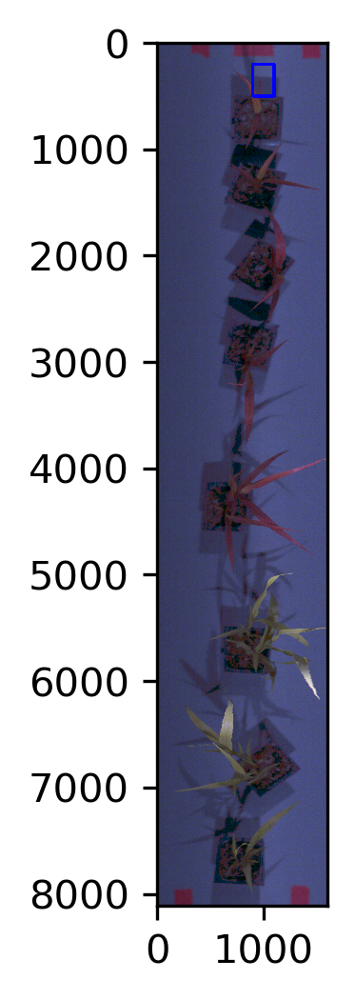

In [74]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi_psent167_1_1, roi_hierarchy_psent167_1_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=900, y=200, h=300, w=200)

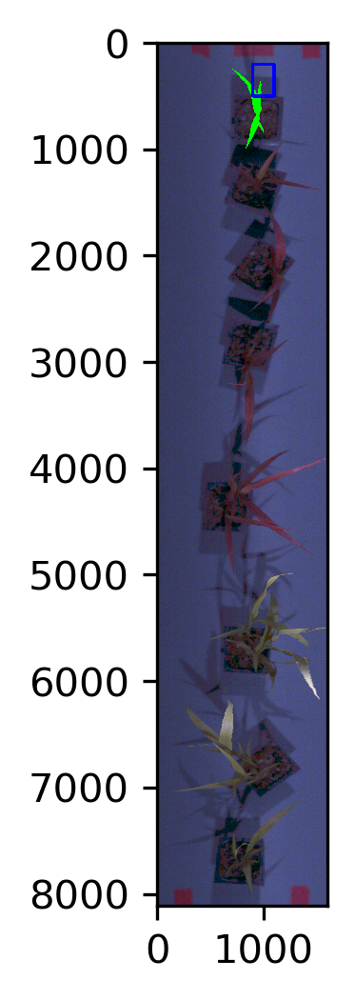

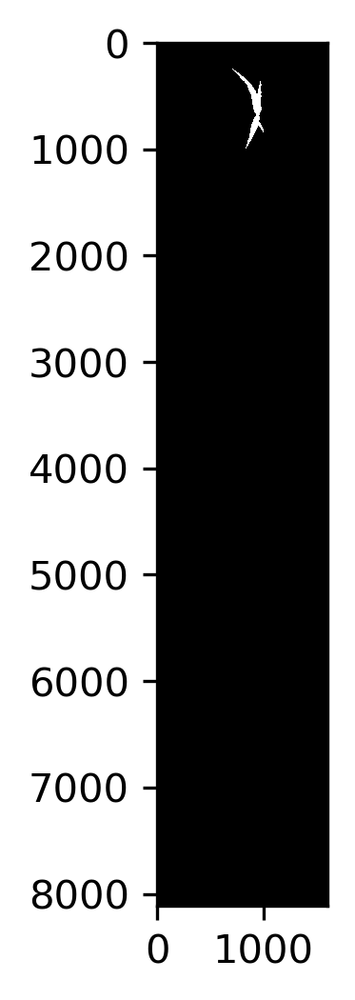

In [75]:
roi_objects_psent167_1_1, hierarchy_psent167_1_1, kept_mask_psent167_1_1, obj_area_psent167_1_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_1_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_1_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-2.7076588, 4361.739] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


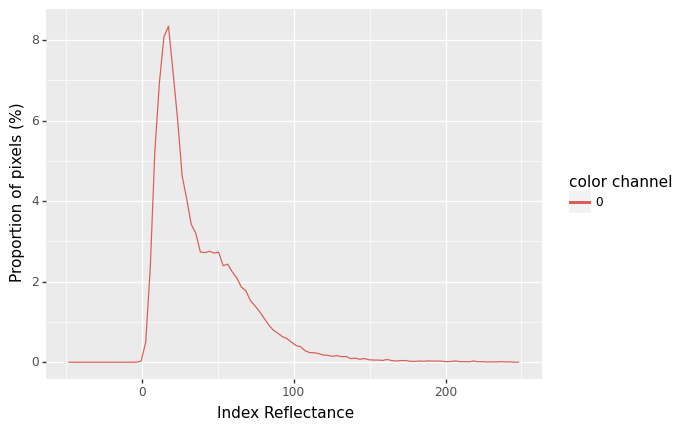

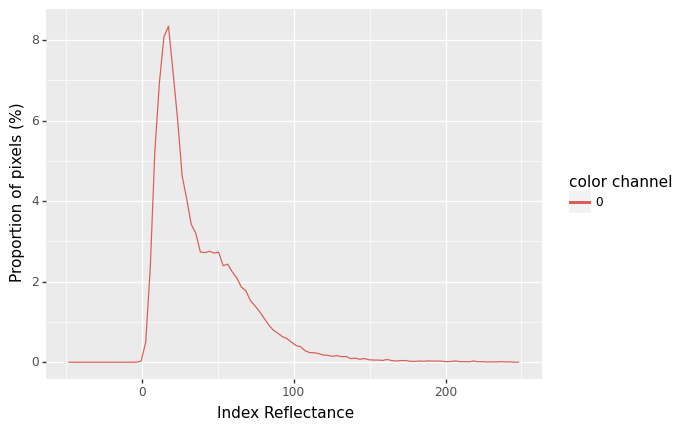

<ggplot: (2984957546078)>

In [76]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_1_1, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [77]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


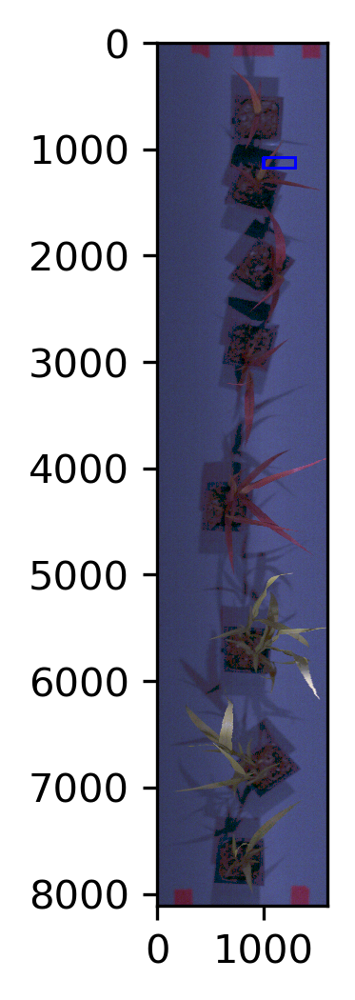

In [78]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi_psent167_2_1, roi_hierarchy_psent167_2_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=1080, h=100, w=300)

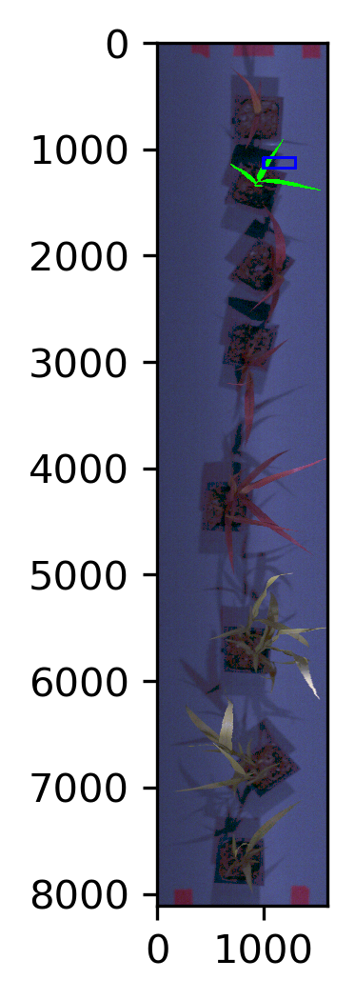

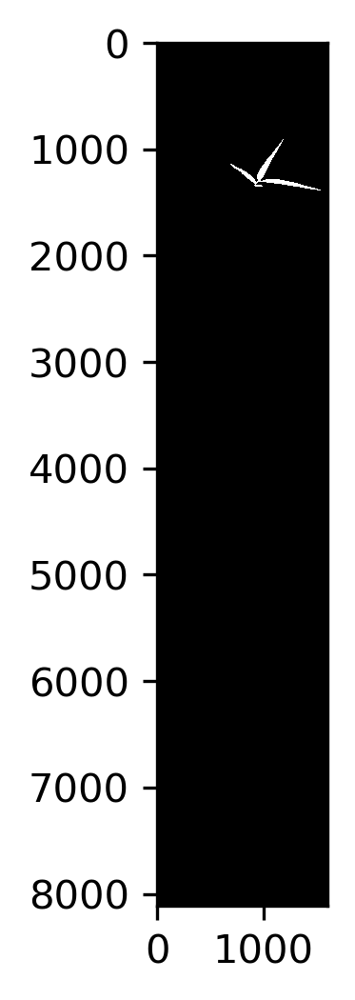

In [79]:
roi_objects_psent167_2_1, hierarchy_psent167_2_1, kept_mask_psent167_2_1, obj_area_psent167_2_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_2_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_2_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-4.5175896, 4243.8037] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


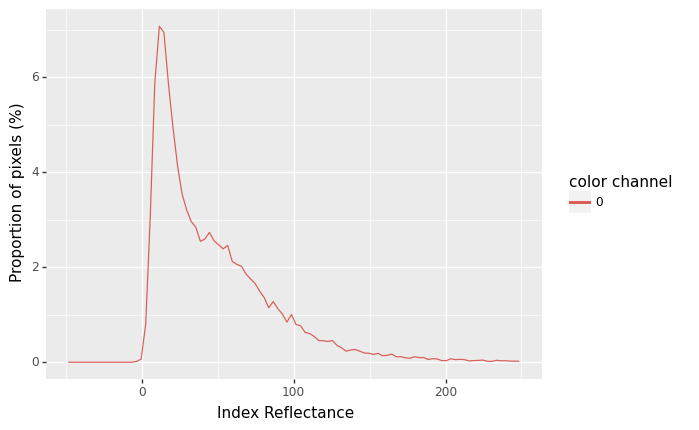

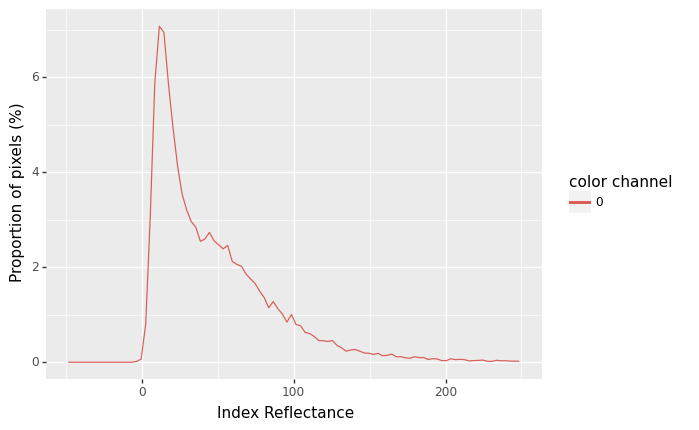

<ggplot: (2982018723530)>

In [80]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_2_1, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [81]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


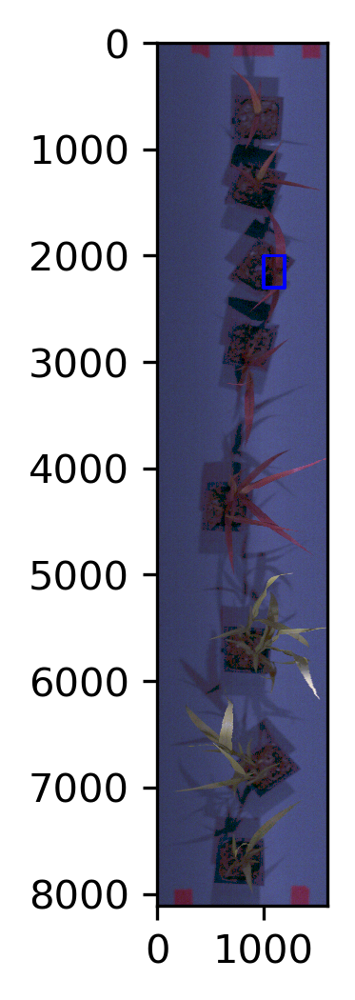

In [82]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_3_1, roi_hierarchy_psent167_3_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2000, h=300, w=200)

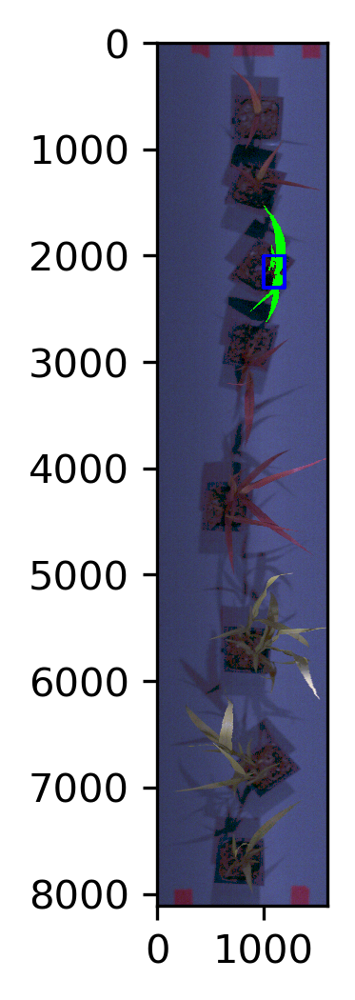

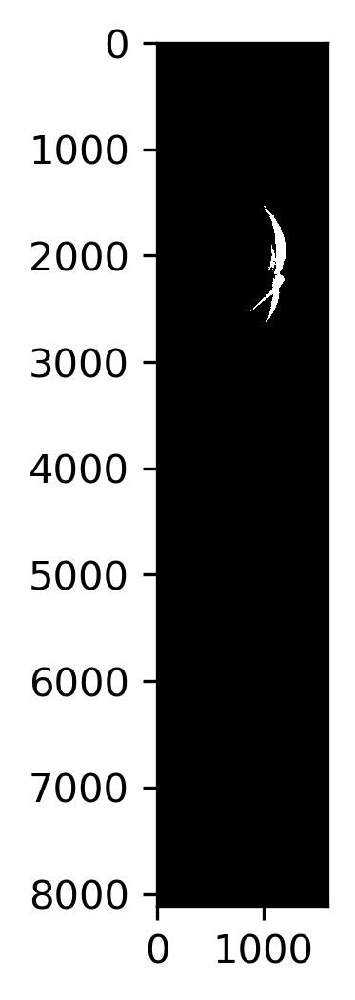

In [83]:
roi_objects_psent167_3_1, hierarchy_psent167_3_1, kept_mask_psent167_3_1, obj_area_psent167_3_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_3_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_3_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-2.754589, 4325.4976] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


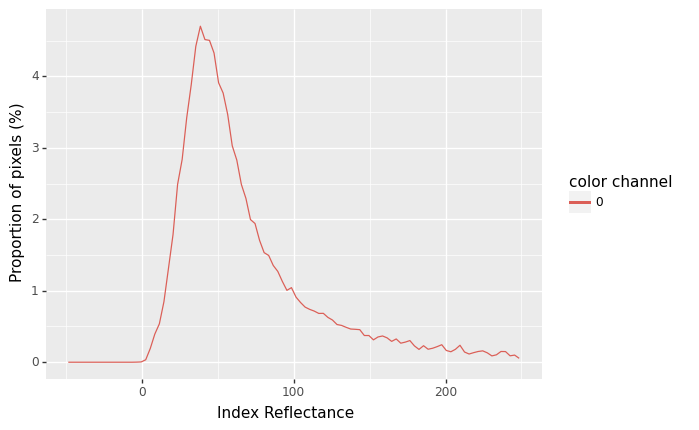

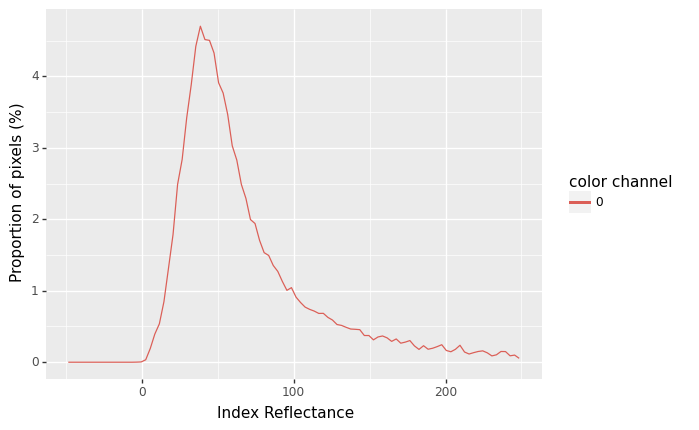

<ggplot: (2984958197489)>

In [84]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_3_1, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [85]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


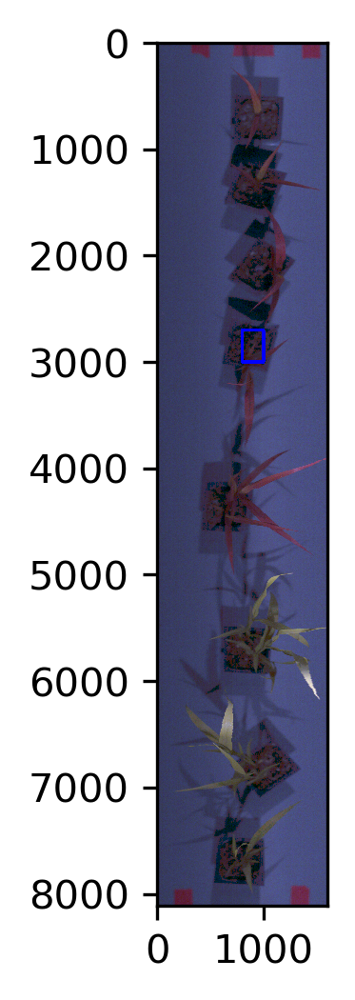

In [86]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_4_10, roi_hierarchy_psent167_4_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=2700, h=300, w=200)

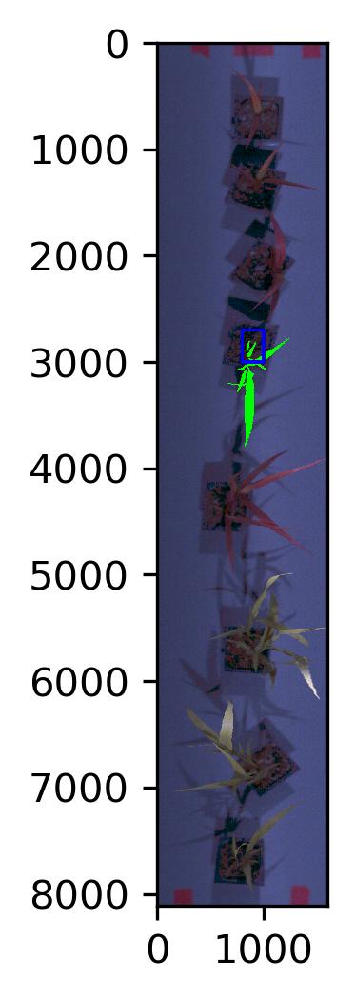

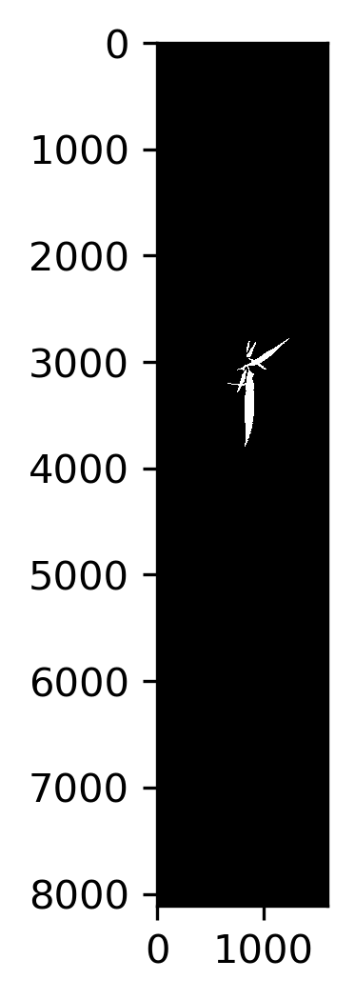

In [87]:
roi_objects_psent167_4_10, hierarchy_psent167_4_10, kept_mask_psent167_4_10, obj_area_psent167_4_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_4_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_4_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-1.9758492, 4284.654] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


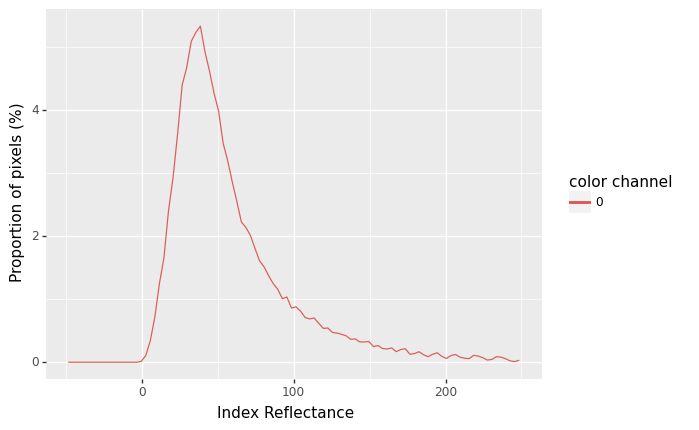

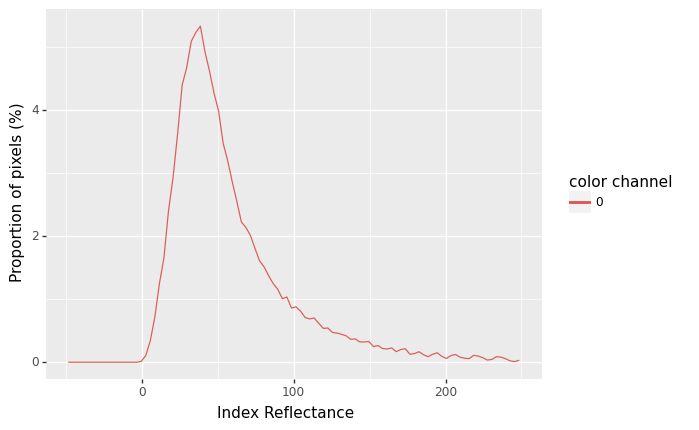

<ggplot: (2982016561625)>

In [88]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_4_10, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [89]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


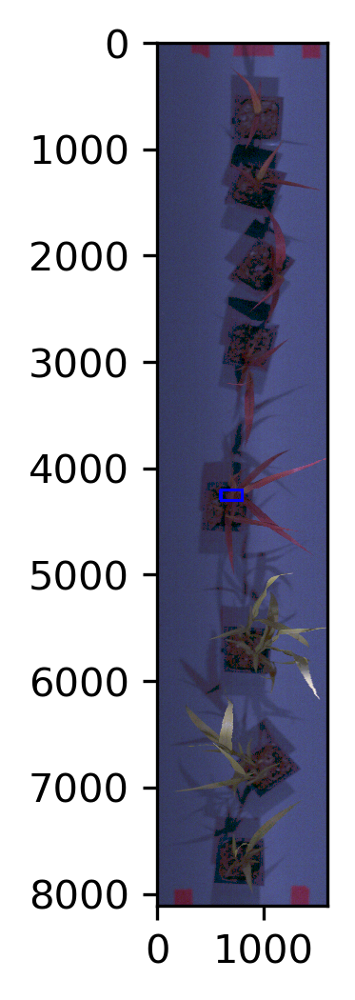

In [90]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_5_10, roi_hierarchy_psent167_5_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=600, y=4200, h=100, w=200)

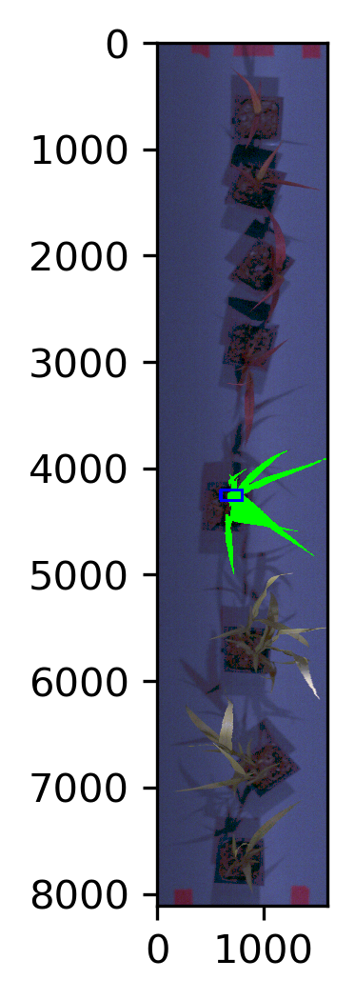

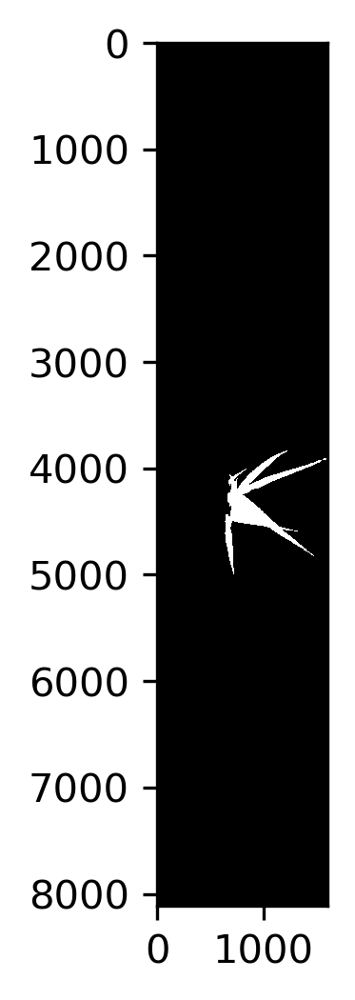

In [91]:
roi_objects_psent167_5_10, hierarchy_psent167_5_10, kept_mask_psent167_5_10, obj_area_psent167_5_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_5_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_5_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-10.066801, 4687.498] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


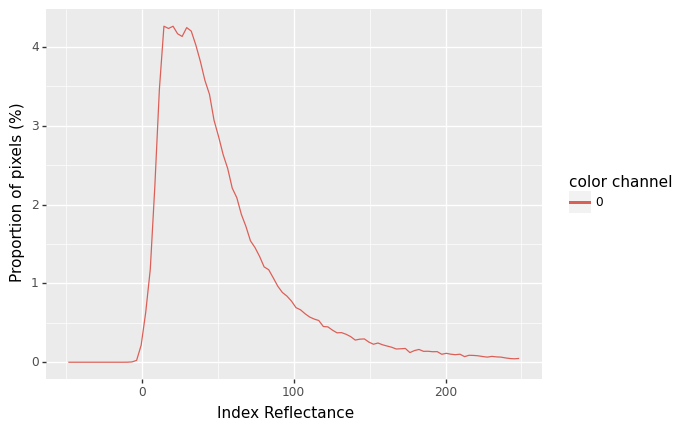

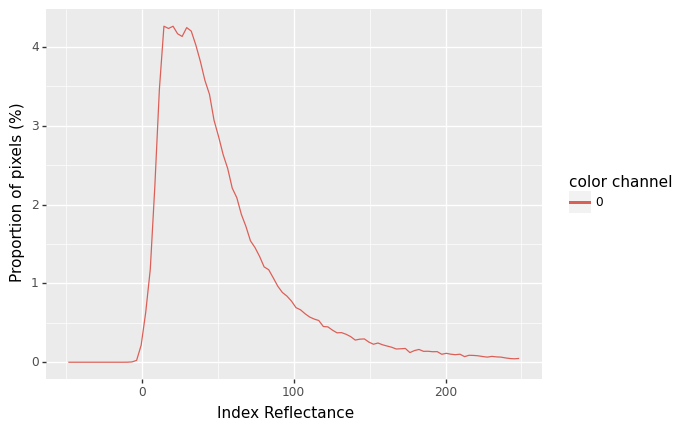

<ggplot: (2984958850100)>

In [92]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_5_10, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [93]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/psent98_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


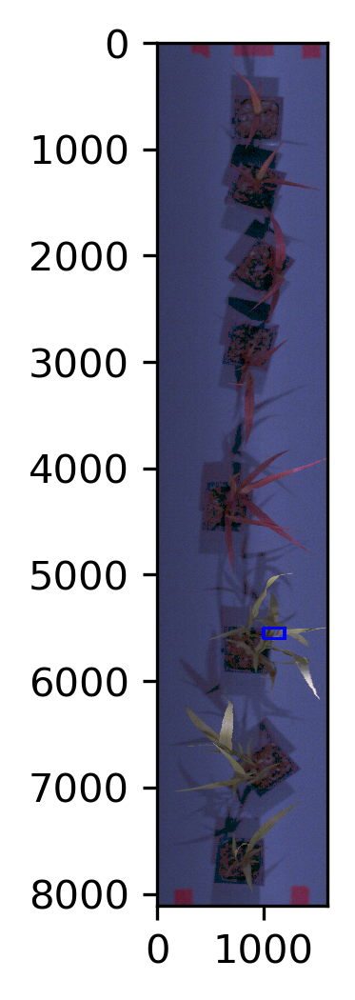

In [94]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10, roi_hierarchy_psent167_6_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=5500, h=100, w=200)

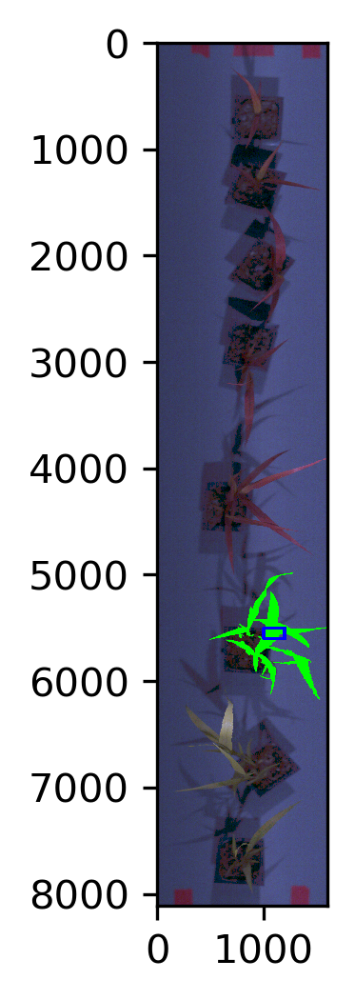

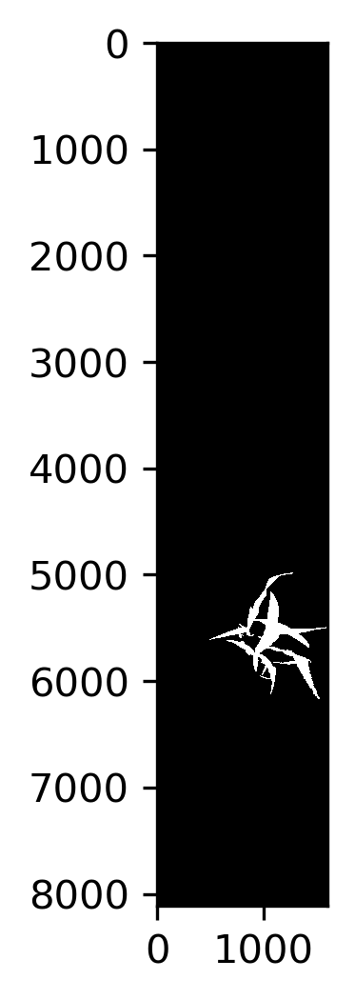

In [95]:
roi_objects_psent167_6_10, hierarchy_psent167_6_10, kept_mask_psent167_6_10, obj_area_psent167_6_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

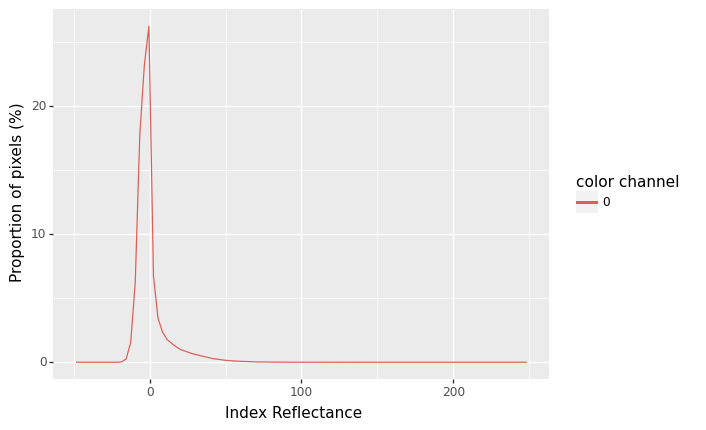

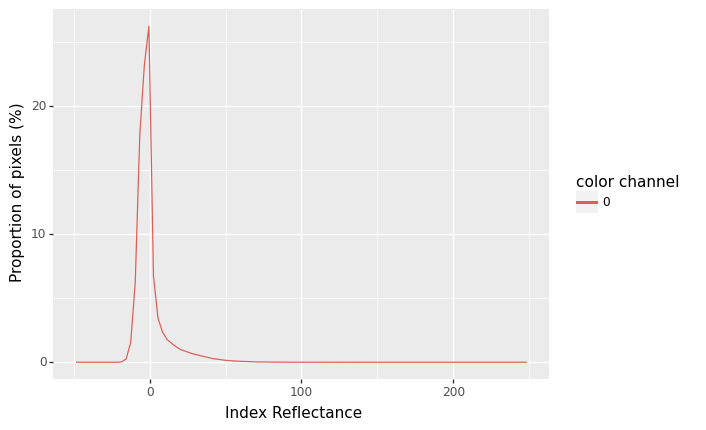

<ggplot: (2982016949056)>

In [96]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [97]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/me034_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


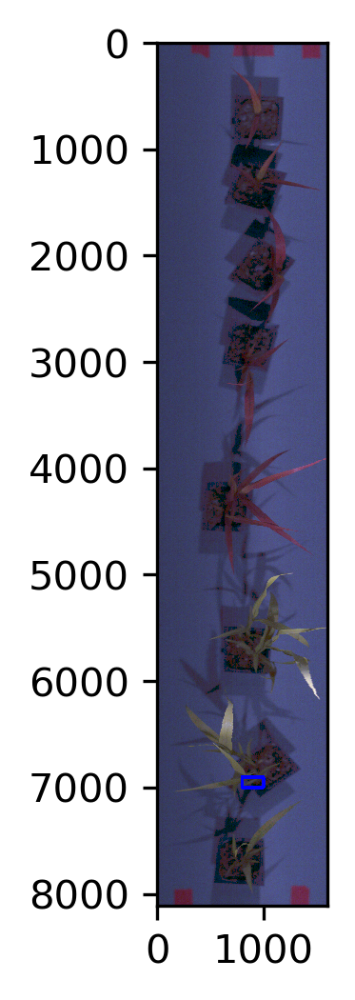

In [98]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_A, roi_hierarchy_psent167_6_10_A = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=6900, h=100, w=200)

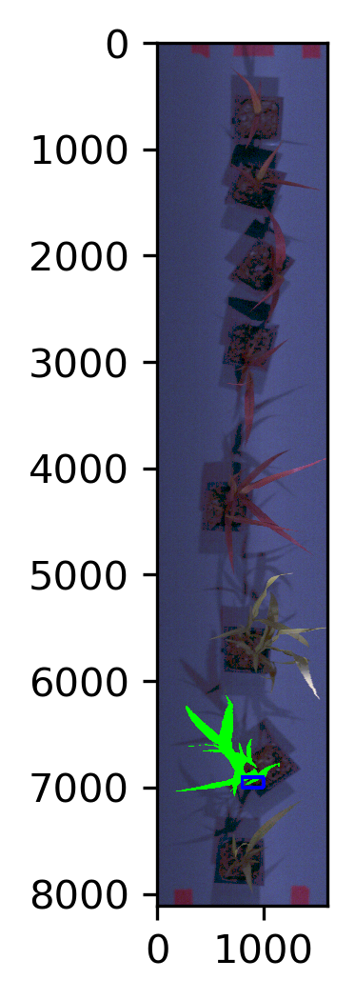

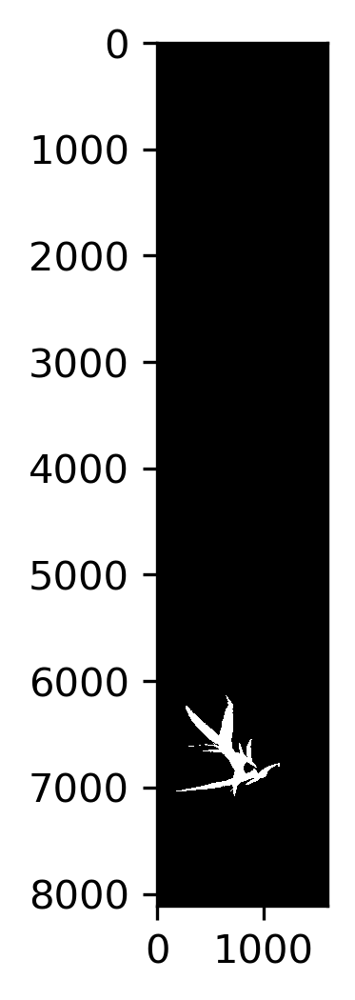

In [99]:
roi_objects_psent167_6_10_A, hierarchy_psent167_6_10_A, kept_mask_psent167_6_10_A, obj_area_psent167_6_10_A = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_A,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_A,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-29.983318, 1401.3303] but the user defined range of bins for pixel frequencies is [-50, 250]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


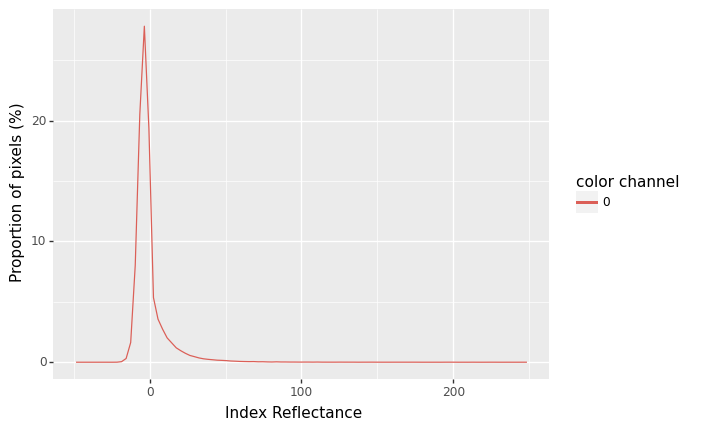

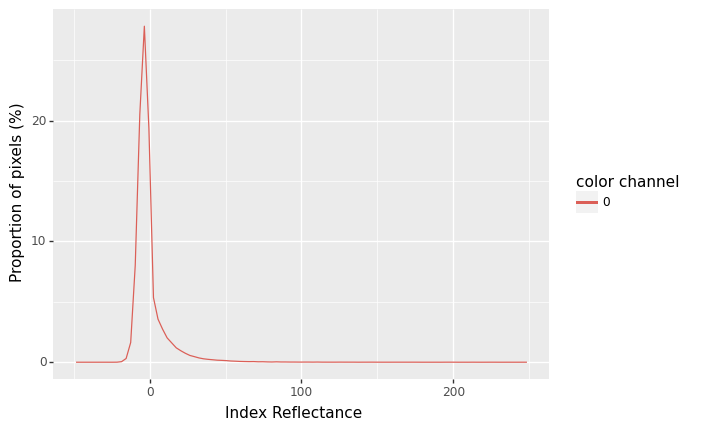

<ggplot: (2982016342986)>

In [100]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_A, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [101]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/me034_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


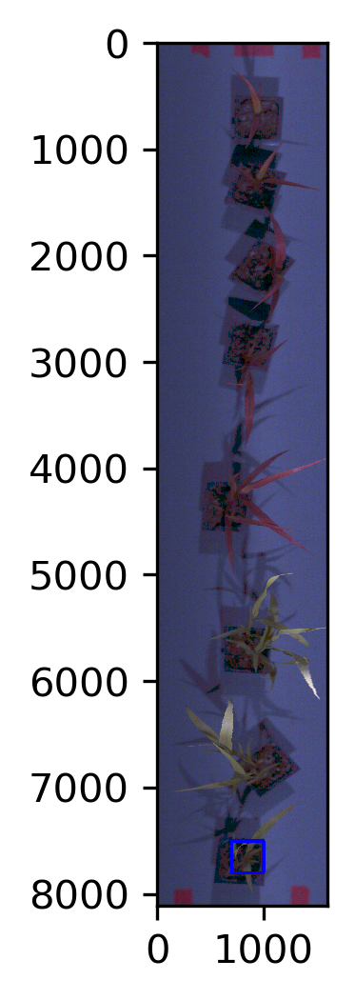

In [102]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_B, roi_hierarchy_psent167_6_10_B = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=700, y=7500, h=300, w=300)

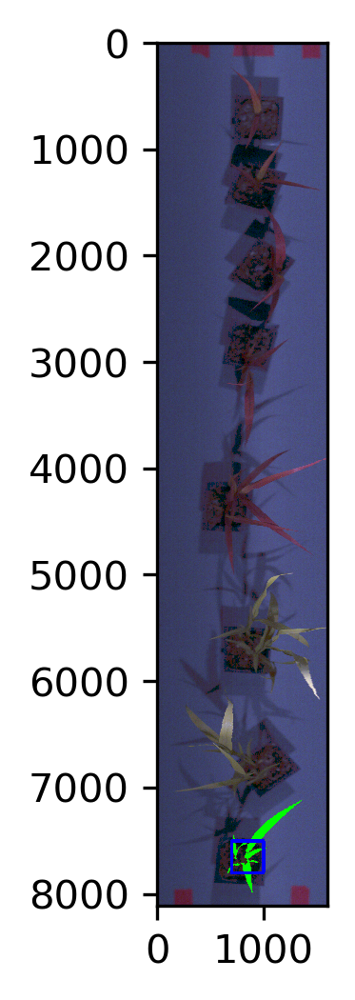

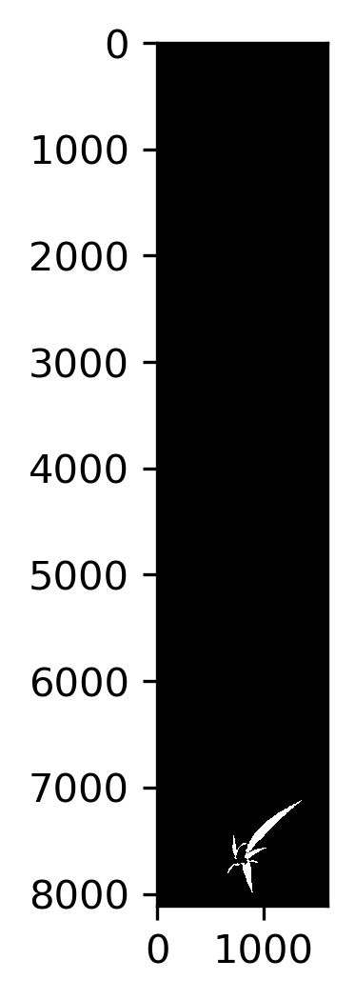

In [103]:
roi_objects_psent167_6_10_B, hierarchy_psent167_6_10_B, kept_mask_psent167_6_10_B, obj_area_psent167_6_10_B = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_B,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_B,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

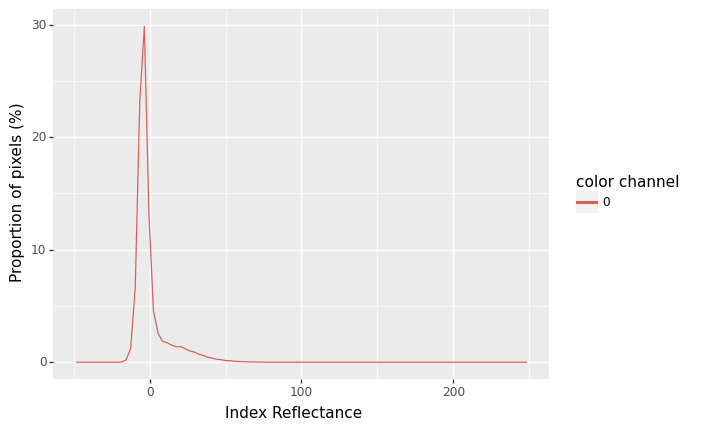

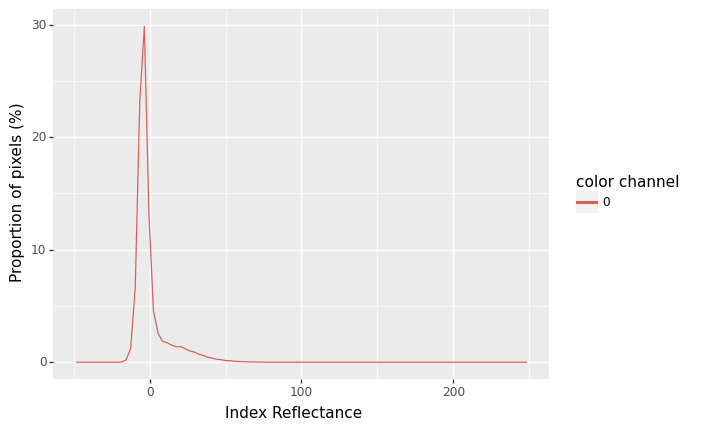

<ggplot: (2982016546250)>

In [104]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_B, histplot=True, bins=100, min_bin=-50, max_bin=250)

In [105]:
### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/psent98_me034/me034_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          
